In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from datetime import datetime
from datetime import timedelta
from dateutil.parser import parse
from datetime import datetime
from pandas.tseries.offsets import Hour, Minute
from pandas.tseries.offsets import Day, MonthEnd
import pytz
from pandas.tseries.offsets import Hour
from pandas.tseries.frequencies import to_offset
## test for stationarity
from statsmodels.tsa.stattools import adfuller

In [2]:
def checkADF(data):
    pvals = []
    
    for col in data.columns:
        y = adfuller(data[col])
        pvals.append(y[0])
    
    #num accepted
    num = 0
    
    for p in pvals:
        if (p<0.05):
            num +=1
    
    return num
        
    



In [3]:
def visualize(data, bus, save):
    ##visualization by day of the year
    dates = pd.PeriodIndex(year=data.Year, month = data.Month ,day = data.Day, freq = "D")
    data['Date'] = dates
    new_data = data.groupby('Date').mean()
    fig1 = plt.figure()
    fig1.set_figwidth(15)
    new_data[bus].plot()
    
    if save == True:
        fig1.savefig('DayMeanWind')

In [4]:
def visualize_day(data, bus, freq, x, save):
    ##visualizes the x first days  and the x last days for the data frame data, bus bus, and of frequency of data collection freq.
    period  = data.Period*freq 
    dates = pd.PeriodIndex(year=data.Year, month = data.Month,day = data.Day, minute = period, freq = "T")
    
    data['Date'] = dates
    new_data  = data.groupby('Date').sum()
    
    fig1 = plt.figure()
    fig1.set_figwidth (20)
    image_first_21 = new_data[bus].plot()
    image_first_21 = fig1.add_subplot(image_first_21)
    
    if save == True:
        fig1.savefig('Wind')
    
    
    
    fig2 = plt.figure()
    fig2.set_figwidth (50)
    image_first_21 = new_data[bus].head(x).plot()
    image_first_21 = fig2.add_subplot(image_first_21)

    if save == True:
        fig2.savefig('Wind_first_couple')
    
    fig3 = plt.figure()
    fig3.set_figwidth (50)
    image_last_21 = new_data[bus].tail(x).plot()
    image_last_21 = fig3.add_subplot(image_last_21)
    
    if save == True:
        fig3.savefig('Wind_last_couple')
        
    #new_data = new_data.drop(['Year',"Month", 'Day', 'Period'],axis='columns')
    
    return new_data


In [5]:
def multidata_FT(model, df1):
    
    c = 0
    
    for col in df1.columns:
        if c==0:
            data = model.fit(df = df1[col].squeeze().to_timestamp()).resid.to_frame()
            c = 1
        else:
            series = model.fit(df = df1.to_timestamp()[col]).resid
            data[col] = series.values
            
    
    return data
        

In [6]:

wind = pd.read_csv('REAL_TIME_wind.csv')
print(len(wind))

105408


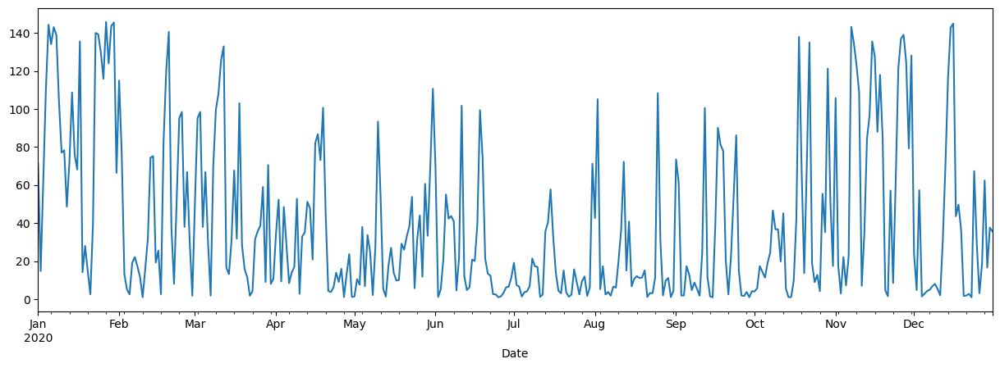

In [7]:
visualize(wind,'309_WIND_1', False)

                  309_WIND_1  317_WIND_1  303_WIND_1  122_WIND_1
Date                                                            
2020-01-01 00:15  144.700000  785.433333  825.366667  700.566667
2020-01-01 00:30  144.566667  784.466667  830.266667  702.433333
2020-01-01 00:45  145.900000  781.033333  821.833333  697.366667
2020-01-01 01:00  145.366667  772.300000  812.333333  698.733333
2020-01-01 01:15  144.400000  775.333333  810.266667  699.100000
...                      ...         ...         ...         ...
2020-12-31 23:00    1.066667   10.600000  140.100000   65.300000
2020-12-31 23:15    0.600000   12.700000  140.600000   90.033333
2020-12-31 23:30    1.033333   17.166667  123.333333   97.000000
2020-12-31 23:45    0.833333   18.666667  120.700000  125.733333
2021-01-01 00:00    0.900000   17.166667  124.666667  139.733333

[35136 rows x 4 columns]


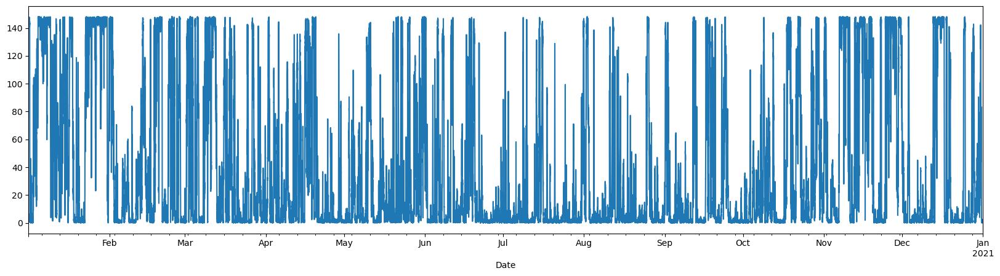

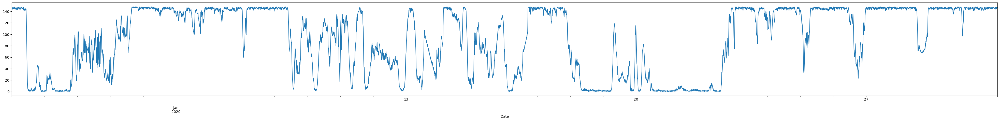

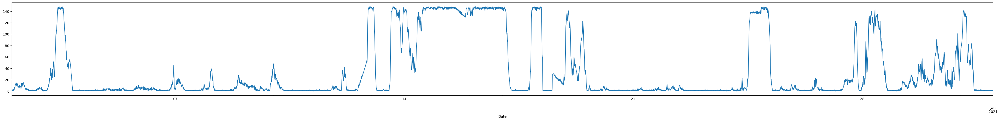

In [8]:
##visualization by every 5 minutes

new_wind = visualize_day(wind, '309_WIND_1',5, 8640, False)
new_wind1 = new_wind.drop(['Year',"Month", 'Day', 'Period'],axis='columns')
new_wind1 = new_wind1.rolling(3).mean().loc[new_wind.index.minute.isin([0, 15, 30, 45])]
print(new_wind1)
new_wind2 = new_wind[['Year',"Month", 'Day', 'Period']].loc[new_wind.index.minute.isin([0, 15, 30, 45])]
new_wind = new_wind1


In [9]:
print(new_wind)

                  309_WIND_1  317_WIND_1  303_WIND_1  122_WIND_1
Date                                                            
2020-01-01 00:15  144.700000  785.433333  825.366667  700.566667
2020-01-01 00:30  144.566667  784.466667  830.266667  702.433333
2020-01-01 00:45  145.900000  781.033333  821.833333  697.366667
2020-01-01 01:00  145.366667  772.300000  812.333333  698.733333
2020-01-01 01:15  144.400000  775.333333  810.266667  699.100000
...                      ...         ...         ...         ...
2020-12-31 23:00    1.066667   10.600000  140.100000   65.300000
2020-12-31 23:15    0.600000   12.700000  140.600000   90.033333
2020-12-31 23:30    1.033333   17.166667  123.333333   97.000000
2020-12-31 23:45    0.833333   18.666667  120.700000  125.733333
2021-01-01 00:00    0.900000   17.166667  124.666667  139.733333

[35136 rows x 4 columns]


In [10]:
%cd ../

C:\Users\bvits\Downloads\Bachelor Thesis\Thesis Code\BachelorThesisRoland


In [11]:
from statsmodels.tsa.seasonal import seasonal_decompose
from src.decomposition.seasonal import STL, FourierDecomposition, MultiSeasonalDecomposition

In [12]:
stl = STL(seasonality_period=288*31, model = "additive")

In [13]:
wind_stl = stl.fit(df = new_wind.to_timestamp()['309_WIND_1'])

In [14]:

#wind_stl.trend
#wind_stl.seasonal
#wind_stl.resid


In [ ]:
wind_stl.plot()

In [16]:
ft = FourierDecomposition(seasonality_period="day", model = "additive", n_fourier_terms=20)

In [17]:


wind_ft = ft.fit(new_wind['309_WIND_1'].squeeze().to_timestamp())


In [18]:
wind_ft.plot()

In [19]:
df = multidata_FT(ft, new_wind)
df.index = df.index.strftime('%Y-%m-%d %H:%M')
new_wind2.index = df.index
print(df)
df = df.join(new_wind2)
print(df)
#df.head()
#df.to_csv('Wind_deseason_15')

                  309_WIND_1  317_WIND_1  303_WIND_1  122_WIND_1
Date                                                            
2020-01-01 00:15   59.031021  213.291319  322.714668  171.005023
2020-01-01 00:30   58.902870  212.354294  327.643074  172.897953
2020-01-01 00:45   60.241386  208.950604  319.238148  167.857550
2020-01-01 01:00   59.713235  200.246913  309.766554  169.250480
2020-01-01 01:15   58.751751  203.309888  307.728294  169.643410
...                      ...         ...         ...         ...
2020-12-31 23:00  -32.440201 -384.371334 -140.022371 -368.072581
2020-12-31 23:15  -32.908254 -382.289561 -139.535716 -343.363601
2020-12-31 23:30  -32.476307 -377.841121 -156.815728 -336.421287
2020-12-31 23:45  -32.677693 -376.359348 -159.462407 -307.712307
2021-01-01 00:00  -42.058575 -439.245553 -200.436567 -377.082855

[35136 rows x 4 columns]
                  309_WIND_1  317_WIND_1  303_WIND_1  122_WIND_1  Year  Month  \
Date                                            

In [20]:
df.to_csv('Wind_deseason_15')